# Image Restoration and Reconstruction

This notebook presents a series of exercises focused on **image restoration and reconstruction** techniques. The main objective is to explore and implement various methods to enhance degraded images in different contexts. Each section addresses a specific real-world application of image processing.

## Contents:
1. **Noise Reduction in Satellite Imagery**  
   In this part, we aim to reduce noise commonly found in satellite images using filtering and denoising techniques.

2. **Deblurring in Medical Imaging**  
   This section focuses on restoring sharpness in blurred medical images, which is crucial for accurate diagnosis and analysis.

3. **Image Restoration Under Fog**  
   Here, we implement algorithms to restore images affected by fog or haze, improving their visibility and contrast.

Throughout the notebook, Python-based image processing techniques will be applied to demonstrate the practical aspects of each restoration challenge.


___ 

## Question number 2: Noise Reduction in Satellite Imagery – Problem Summary

In this task, we aim to reduce noise in satellite images caused by atmospheric interference, sensor limitations, and transmission errors. The goal is to enhance image clarity for remote sensing purposes.

Tasks:
- **(a)** Apply three noise reduction filters: **Mean**, **Median**, and **Gaussian**. Compare their effectiveness based on visual quality and noise suppression.
- **(b)** Evaluate how well each filter preserves **edges** and fine details. Identify which filter best maintains important image structures.
- **(c)** Assuming the noise follows a **Gaussian distribution**, apply **Wiener filtering** and compare its performance with the previous filters.
- **(d)** Investigate **adaptive filtering** methods. Implement an **adaptive median filter** and compare its results to the standard methods.


### Part a

In [12]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import os

from scipy.fftpack import fft2, fftshift, ifft2
from skimage import io, img_as_float
from scipy.ndimage import gaussian_filter

In [2]:
# Load image
img_path = '/mnt/e/Term 4/hw/DIP-HW4/data/images/q2/Mars.png'
img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)

In [3]:
# Apply noise reduction filters (Mean, Median, and Gaussian)
# Mean filter
mean = cv2.blur(img, ksize=(3, 3))

# Median filter
median = cv2.medianBlur(img, ksize=3)

# Gaussian filter
gaussian = cv2.GaussianBlur(img, ksize=(3, 3), sigmaX=0)

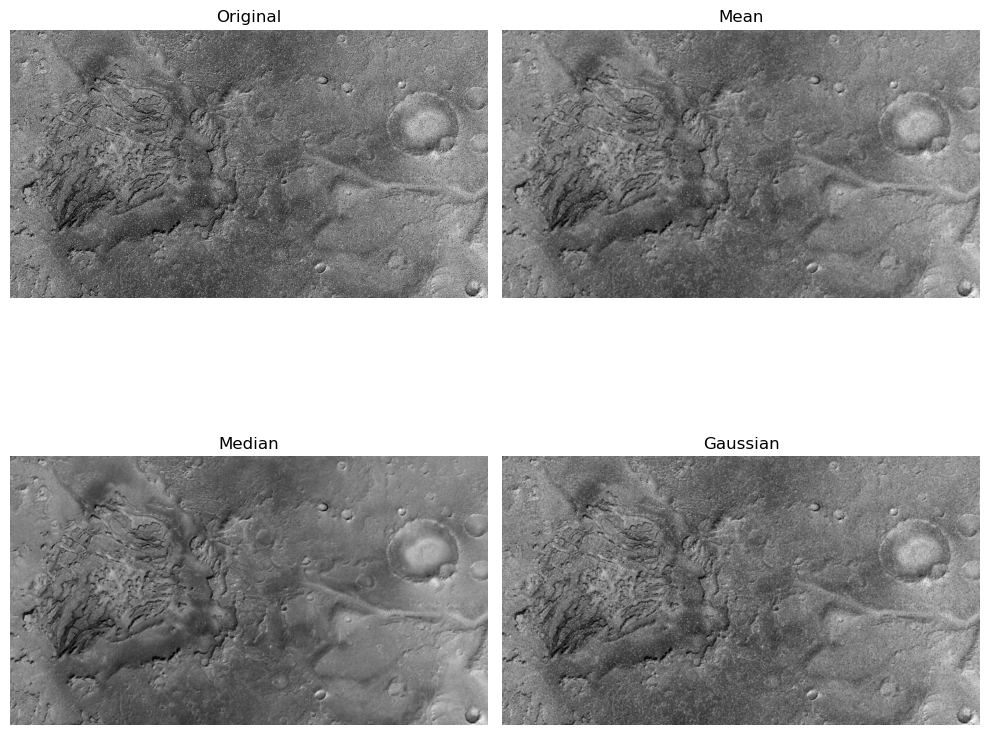

In [4]:
# Display images
titles = ['Original', 'Mean', 'Median', 'Gaussian']
images = [img, mean, median, gaussian]

plt.figure(figsize=(10, 10))
for i in range(4):
    plt.subplot(2, 2, i+1)
    plt.imshow(images[i], cmap='gray')
    plt.title(titles[i])
    plt.axis('off')

plt.tight_layout()
plt.show()

In [5]:
# # Save images
# cv2.imwrite("mean_filtered.jpg", mean)
# cv2.imwrite("median_filtered.jpg", median)
# cv2.imwrite("gaussian_filtered.jpg", gaussian)

In [6]:
# Evaluation of Method Effectiveness
from skimage.metrics import peak_signal_noise_ratio as psnr, structural_similarity as ssim

print("Mean PSNR:", psnr(img, mean))
print("Median PSNR:", psnr(img, median))
print("Gaussian PSNR:", psnr(img, gaussian))

print("Mean SSIM:", ssim(img, mean))
print("Median SSIM:", ssim(img, median))
print("Gaussian SSIM:", ssim(img, gaussian))


Mean PSNR: 17.78466642374896
Median PSNR: 17.49756737817909
Gaussian PSNR: 19.243479553732016
Mean SSIM: 0.3172768311235811
Median SSIM: 0.25104305171963
Gaussian SSIM: 0.5247483978239877


## Part b

In [7]:
import cv2
print(cv2.__version__)

4.12.0


In [8]:
print("Minimum intensity:", np.min(img))
print("Maximum intensity:", np.max(img))

Minimum intensity: 0
Maximum intensity: 255


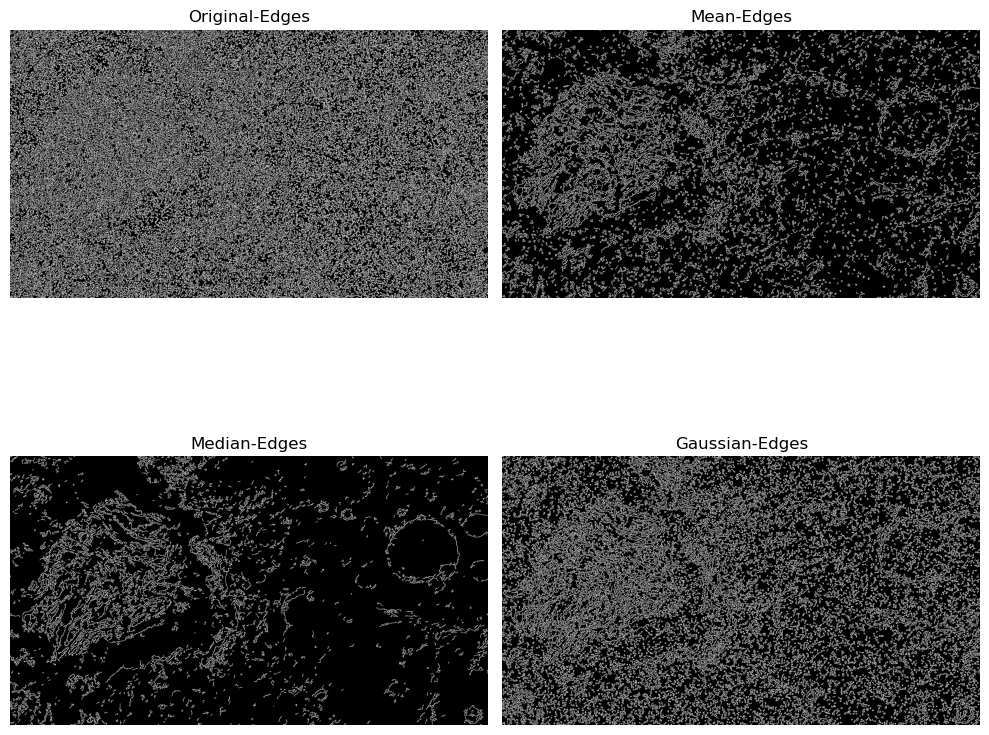

In [9]:
edges_original = cv2.Canny(img, 100, 200, apertureSize=3, L2gradient=False)
edges_gaussian = cv2.Canny(gaussian, 100, 200)
edges_median = cv2.Canny(median, 100, 200)
edges_mean = cv2.Canny(mean, 100, 200)

# Display edges
titles = ['Original-Edges', 'Mean-Edges', 'Median-Edges', 'Gaussian-Edges']
images = [edges_original, edges_mean, edges_median, edges_gaussian]

plt.figure(figsize=(10, 10))
for i in range(4):
    plt.subplot(2, 2, i+1)
    plt.imshow(images[i], cmap='gray')
    plt.title(titles[i])
    plt.axis('off')

plt.tight_layout()
plt.show()

## Part c

In [10]:
from skimage import img_as_float
from scipy.signal import wiener
from skimage.restoration import estimate_sigma
from skimage.metrics import peak_signal_noise_ratio as psnr
from skimage.metrics import structural_similarity as ssim

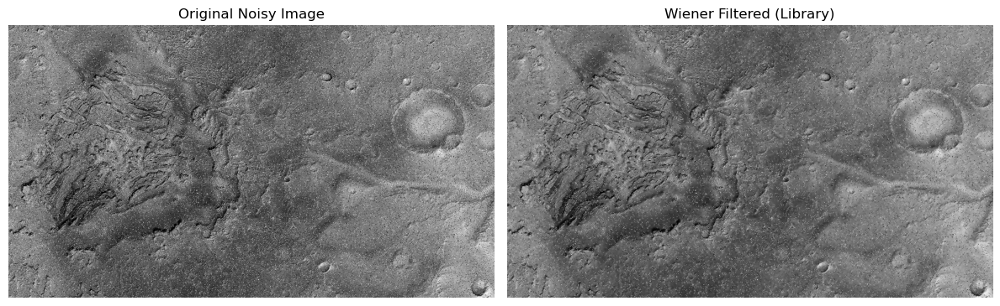

PSNR: 26.20 dB
SSIM: 0.878


In [11]:
img = img_as_float(img)

# Estimate Gaussian noise standard deviation
sigma_est = estimate_sigma(img, channel_axis=None, average_sigmas=True)

# Apply Wiener filter
wiener_filtered = wiener(img, mysize=5, noise=sigma_est**2)

psnr_value = psnr(img, wiener_filtered)
ssim_value = ssim(img, wiener_filtered, data_range=wiener_filtered.max() - wiener_filtered.min())

# Step 5: Display original and filtered image
fig, axs = plt.subplots(1, 2, figsize=(12, 6))
axs[0].imshow(img, cmap='gray')
axs[0].set_title("Original Noisy Image")
axs[0].axis("off")
axs[1].imshow(wiener_filtered, cmap='gray')
axs[1].set_title("Wiener Filtered (Library)")
axs[1].axis("off")
plt.tight_layout()
plt.show()

# Step 6: Print results
print(f"PSNR: {psnr_value:.2f} dB")
print(f"SSIM: {ssim_value:.3f}")

## Part d

In [18]:
import numpy as np
from skimage import io, util
import matplotlib.pyplot as plt

def adaptive_median_filter(image, S_max):
    """
    Applies the Adaptive Median Filter to remove impulse noise.
    
    Param:
        :image (ndarray): Input grayscale image (uint8).
        :S_max (int): Maximum allowed size of the window (must be odd).
        
    Returns:
        :output (ndarray): Filtered image.
    """
    if image.dtype == np.float64 or image.max() <= 1.0:
        image = (image * 255).astype(np.uint8)

    image = image.astype(np.int32)  
    pad_size = S_max // 2
    padded = np.pad(image, pad_size, mode='edge')
    output = np.zeros_like(image)

    rows, cols = image.shape

    for i in range(rows):
        for j in range(cols):
            window_size = 3
            found = False
            while window_size <= S_max:
                half = window_size // 2
                x, y = i + pad_size, j + pad_size
                window = padded[x - half:x + half + 1, y - half:y + half + 1]

                z_min = window.min()
                z_max = window.max()
                z_med = np.median(window)
                z_xy = padded[x, y]

                A1 = z_med - z_min
                A2 = z_med - z_max

                if A1 > 0 and A2 < 0:
                    B1 = z_xy - z_min
                    B2 = z_xy - z_max
                    if B1 > 0 and B2 < 0:
                        output[i, j] = z_xy
                    else:
                        output[i, j] = z_med
                    found = True
                    break
                else:
                    window_size += 2
            if not found:
                output[i, j] = z_med
    return output.astype(np.uint8)

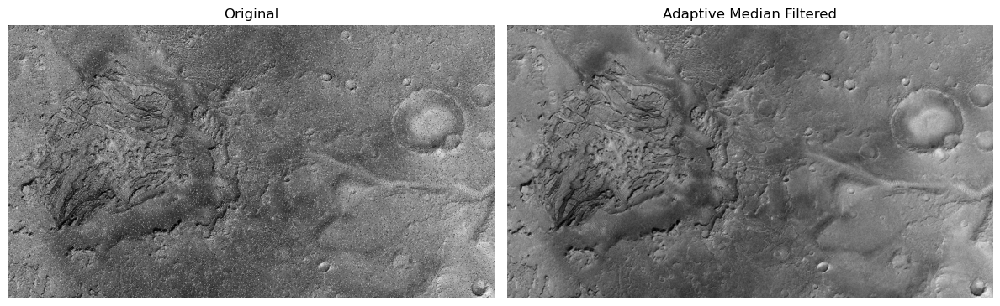

In [20]:
# Apply adaptive median filter
adaptive_median_filtered = adaptive_median_filter(img, S_max=7)

# Display original and filtered images
fig, ax = plt.subplots(1, 2, figsize=(12, 5))
ax[0].imshow(img, cmap='gray')
ax[0].set_title("Original")
ax[0].axis('off')

ax[1].imshow(adaptive_median_filtered, cmap='gray')
ax[1].set_title("Adaptive Median Filtered")
ax[1].axis('off')

plt.tight_layout()
plt.show()

In [22]:
psnr_value = psnr(img, adaptive_median_filtered, data_range=255)
ssim_value = ssim(img, adaptive_median_filtered, data_range=255)

print(f"PSNR: {psnr_value:.2f} dB")
print(f"SSIM: {ssim_value:.3f}")

PSNR: 6.95 dB
SSIM: 0.002


____

Image shape is: (1327, 883)


(-0.5, 882.5, 1326.5, -0.5)

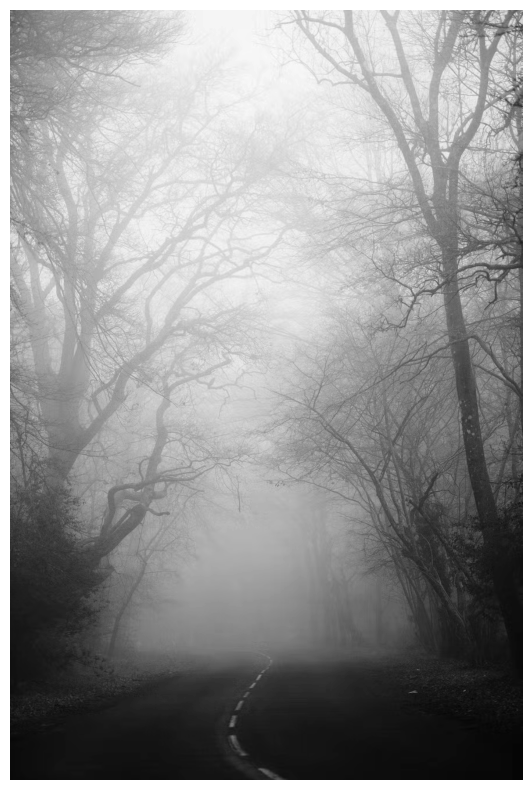

In [10]:
# Path to the image
image_path = '/mnt/e/Term 4/HW/DIP-HW4/data/images/q4/fog.png'  

# Load the image in grayscale
img = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
if img is None:
    raise ValueError("Image not found!")

print(f'Image shape is: {img.shape}')

plt.figure(figsize=(14, 10))
plt.imshow(img, cmap='gray')
plt.axis('off')

In [8]:
y1,y2 = 1270, 1327
x1, x2 = 500, 883
region_1 = img[y1:y2, x1:x2]

mean_noise1 = np.mean(region_1)
var_noise1 = np.var(region_1)

print(f"Estimated noise mean: {mean_noise1:.2f}")
print(f"Estimated noise variance: {var_noise1:.2f}")

Estimated noise mean: 39.82
Estimated noise variance: 9.05


(256, 1)


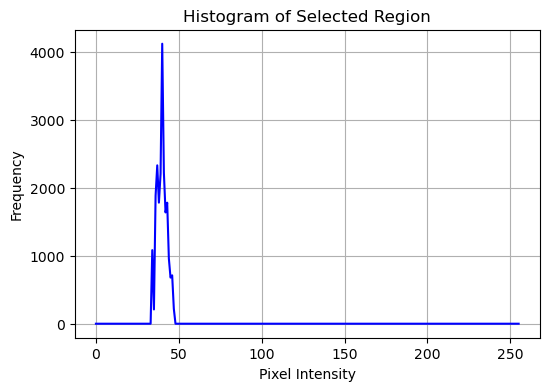

In [ ]:
# Compute histogram
hist = cv2.calcHist([region_1], [0], None, [256], [0, 256])
hist = hist.flatten()

# Plot
plt.figure(figsize=(6, 4))
plt.title("Histogram of Selected Region")
plt.xlabel("Pixel Intensity")
plt.ylabel("Frequency")
plt.plot(hist, color='blue')
plt.grid(True)
plt.show()

In [13]:
# Load the degraded image 
g = img.copy()
M, N = g.shape

In [17]:
# Define assumed Gaussian kernel (degradation function H)
def gaussian_kernel(size, sigma):
    """Create a centered Gaussian kernel."""
    ax = np.arange(-size // 2 + 1., size // 2 + 1.)
    xx, yy = np.meshgrid(ax, ax)
    kernel = np.exp(-(xx**2 + yy**2) / (2. * sigma**2))
    return kernel / np.sum(kernel)

kernel_size = 5
sigma_blur = 0.05
gaussian = gaussian_kernel(kernel_size, sigma_blur)
row, col = gaussian.shape

gaussian_padded = np.zeros(img.shape)
gaussian_padded[:row, :col] = gaussian

H = np.fft.fft2(gaussian_padded)


In [19]:
# Laplacian operator in frequency domain 
laplacian_kernel = np.array([[0, -1, 0],
                             [-1, 4, -1],
                             [0, -1, 0]])
P = np.fft.fft2(laplacian_kernel, s=(M, N))

In [20]:
# Constrained Least Squares Filtering Function
def compute_restored_image(g, H, P, gamma):
    """Compute the restored image using constrained least squares filtering."""
    H_conj = np.conj(H)
    denominator = np.abs(H)**2 + gamma * np.abs(P)**2
    F_hat = (H_conj / denominator) * fft2(g)
    f_hat = np.real(ifft2(F_hat))
    return f_hat

In [21]:
# Gamma Estimation Function Based on Residual Energy Matching
def find_gamma_updated(g, H, P, sigma2, tol=1e-3, max_iter=50):
    """
    Find optimal gamma such that residual energy matches noise energy.
    """
    M, N = g.shape
    eta_energy_target = M * N * sigma2  # assuming zero-mean noise
    gamma_low, gamma_high = 1e-6, 1e2

    for i in range(max_iter):
        gamma_mid = (gamma_low + gamma_high) / 2
        f_hat = compute_restored_image(g, H, P, gamma_mid)

        # Residual r = g - H f_hat
        G_hat = fft2(g)
        F_hat = fft2(f_hat)
        R_hat = G_hat - H * F_hat
        r = np.real(ifft2(R_hat)) 

        # Residual energy ||r||^2
        residual_energy = np.sum(r**2)

        # Check convergence
        if np.abs(residual_energy - eta_energy_target) < tol:
            print(f"γ found in {i+1} iterations: {gamma_mid}")
            return gamma_mid
        elif residual_energy > eta_energy_target:
            gamma_low = gamma_mid
        else:
            gamma_high = gamma_mid

    print(f"γ approximate after {max_iter} iterations: {gamma_mid}")
    return gamma_mid

sigma_noise = 3

# Run Restoration
gamma = find_gamma_updated(g, H, P, sigma2=sigma_noise)
restored = compute_restored_image(g, H, P, gamma)

γ approximate after 50 iterations: 99.99999999999991


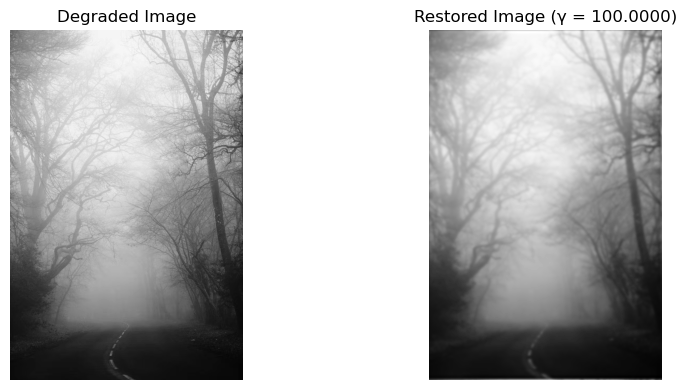

In [22]:
# Display the Results 
plt.figure(figsize=(10, 4))
plt.subplot(1, 2, 1)
plt.imshow(g, cmap='gray')
plt.title("Degraded Image")
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(restored, cmap='gray')
plt.title(f"Restored Image (γ = {gamma:.4f})")
plt.axis('off')

plt.tight_layout()
plt.show()

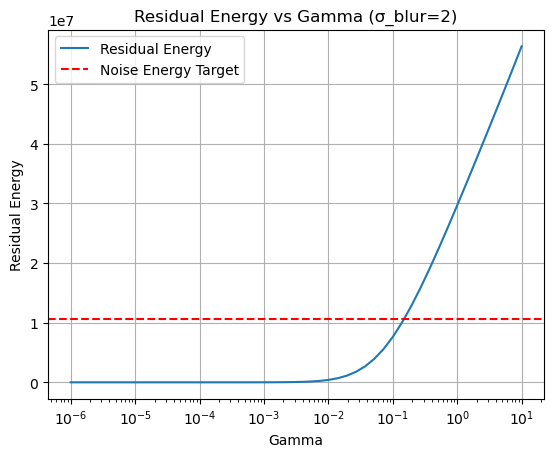

In [24]:
gammas = np.logspace(-6, 1, 50)
residuals = []

for gamma in gammas:
    f_hat = compute_restored_image(g, H, P, gamma)
    G_hat = fft2(g)
    F_hat = fft2(f_hat)
    R_hat = G_hat - H * F_hat
    r = np.real(ifft2(R_hat))
    residuals.append(np.sum(r**2))

eta_energy_target = M * N * 9

plt.semilogx(gammas, residuals, label='Residual Energy')
plt.axhline(y=eta_energy_target, color='r', linestyle='--', label='Noise Energy Target')
plt.xlabel('Gamma')
plt.ylabel('Residual Energy')
plt.title('Residual Energy vs Gamma (σ_blur=2)')
plt.legend()
plt.grid(True)
plt.show()


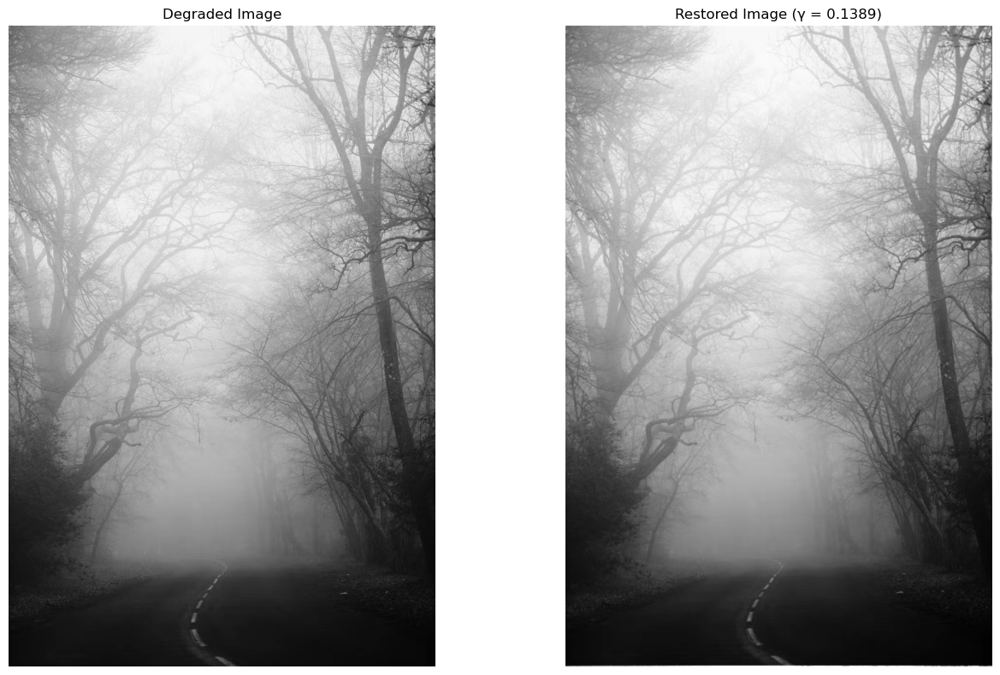

In [36]:
diff = [r - eta_energy_target for r in residuals]
idx = np.argmin(np.abs(diff))
optimal_gamma = gammas[idx]
optimal_gamma

restored_opt = compute_restored_image(g, H, P, optimal_gamma)

# Display the Results 
plt.figure(figsize=(14, 8))
plt.subplot(1, 2, 1)
plt.imshow(g, cmap='gray')
plt.title("Degraded Image")
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(restored_opt, cmap='gray')
plt.title(f"Restored Image (γ = {optimal_gamma:.4f})")
plt.axis('off')

plt.tight_layout()
plt.show()

___

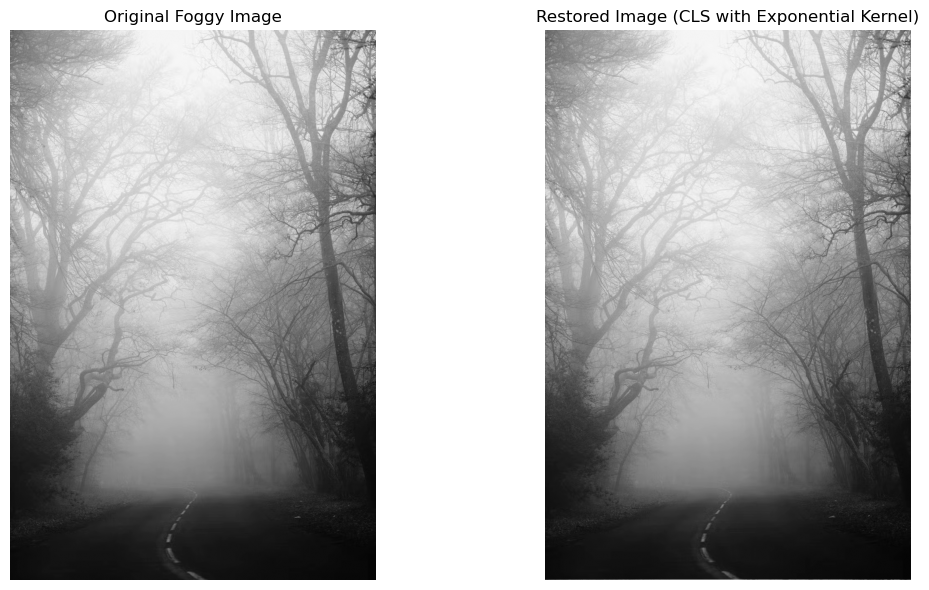

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import cv2
from scipy.fft import fft2, ifft2

# Load the foggy image
image_path = "/mnt/e/Term 4/HW/HW4/DIP-HW4/HW4/images/q4/fog.png" 
foggy_image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
foggy_image = foggy_image.astype(np.float32) / 255.0  # Normalize to [0, 1]

# Create an exponential blur kernel (more realistic for fog)
def exponential_kernel(size, alpha):
    """2D isotropic exponential PSF kernel."""
    ax = np.arange(-size // 2 + 1., size // 2 + 1.)
    xx, yy = np.meshgrid(ax, ax)
    radius = np.sqrt(xx**2 + yy**2)
    kernel = np.exp(-radius / alpha)
    return kernel / np.sum(kernel)

kernel_size = 3
alpha = 0.1
psf = exponential_kernel(kernel_size, alpha)

# Pad the PSF to image size
psf_padded = np.zeros_like(foggy_image)
psf_padded[:psf.shape[0], :psf.shape[1]] = psf
H = fft2(psf_padded)

# Laplacian operator for smoothness constraint
laplacian = np.array([[0, -1, 0],
                      [-1, 4, -1],
                      [0, -1, 0]])
laplacian_padded = np.zeros_like(foggy_image)
laplacian_padded[:3, :3] = laplacian
P = fft2(laplacian_padded)

# Choose regularization parameter (γ)
gamma = 0.001  

# Apply Constrained Least Squares filtering
G = fft2(foggy_image)
H_conj = np.conj(H)
denominator = (np.abs(H) ** 2) + gamma * (np.abs(P) ** 2)
F_hat = (H_conj / denominator) * G
restored_image = np.abs(ifft2(F_hat))

# Display results
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.title("Original Foggy Image")
plt.imshow(foggy_image, cmap='gray')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.title("Restored Image (CLS with Exponential Kernel)")
plt.imshow(restored_image, cmap='gray')
plt.axis('off')

plt.tight_layout()
plt.show()


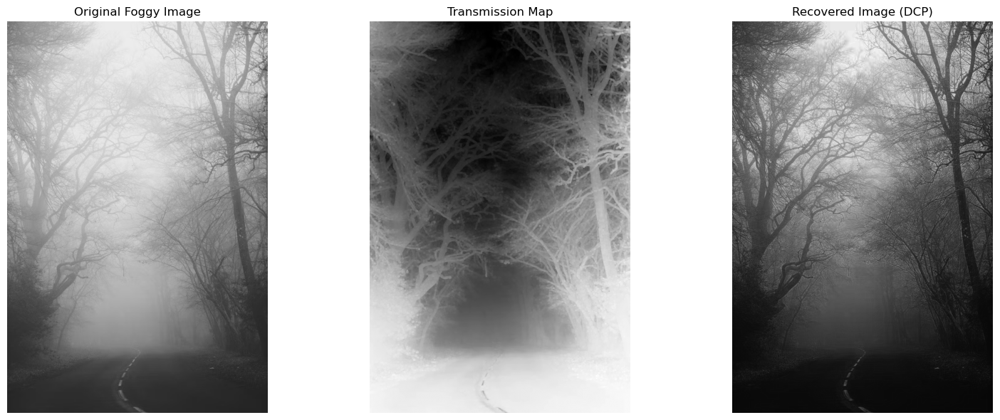

In [ ]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
from scipy.ndimage import minimum_filter

# Load the foggy image in RGB
image_path = "/mnt/e/Term 4/HW/HW4/DIP-HW4/HW4/images/q4/fog.png"  
foggy_image = cv2.imread(image_path)
foggy_image = cv2.cvtColor(foggy_image, cv2.COLOR_BGR2RGB)  # Convert from BGR to RGB
foggy_image = foggy_image.astype(np.float32) / 255.0  # Normalize to [0, 1]

# Get the dark channel
def get_dark_channel(image, size=9):
    """
    Compute the dark channel of the image.
    """
    min_channel = np.min(image, axis=2)
    dark_channel = minimum_filter(min_channel, size=size)
    return dark_channel

# Estimate the atmospheric light
def estimate_atmospheric_light(image, dark_channel, top_percent=0.005):
    """
    Estimate the atmospheric light from the brightest pixels in the dark channel.
    """
    h, w = dark_channel.shape
    num_pixels = h * w
    num_brightest = int(max(num_pixels * top_percent, 1))
    dark_vec = dark_channel.reshape(num_pixels)
    image_vec = image.reshape(num_pixels, 3)
    indices = dark_vec.argsort()[-num_brightest:]
    A = np.mean(image_vec[indices], axis=0)
    return A

# Estimate transmission map
def estimate_transmission(image, A, omega=0.9, size=9):
    """
    Estimate the transmission map using normalized image and dark channel.
    """
    normed = image / A
    transmission = 1 - omega * get_dark_channel(normed, size)
    return transmission

# Recover scene radiance
def recover_radiance(image, transmission, A, t0=0.2):
    """
    Recover the scene radiance (dehazed image).
    """
    transmission = np.clip(transmission, t0, 1.0)[..., np.newaxis]
    J = (image - A) / transmission + A
    J = np.clip(J, 0, 1)
    return J

# Apply DCP
dark_channel = get_dark_channel(foggy_image, size=5)
A = estimate_atmospheric_light(foggy_image, dark_channel)
transmission = estimate_transmission(foggy_image, A, omega=0.8, size=5)
recovered = recover_radiance(foggy_image, transmission, A)

# Display results
plt.figure(figsize=(16, 6))

plt.subplot(1, 3, 1)
plt.title("Original Foggy Image")
plt.imshow(foggy_image)
plt.axis('off')

plt.subplot(1, 3, 2)
plt.title("Transmission Map")
plt.imshow(transmission, cmap='gray')
plt.axis('off')

plt.subplot(1, 3, 3)
plt.title("Recovered Image (DCP)")
plt.imshow(recovered)
plt.axis('off')

plt.tight_layout()
plt.show()


___

# Answer to Question 3

In this project, three MRI images suffering from blurring were provided. Using two expert-restored images, we estimated the degradation transfer function. We first applied Inverse Filtering, but due to the presence of white noise, the output was highly corrupted, as small or zero values in the filter amplified the noise. Next, we applied Wiener Filtering and used a grid search with the ideal images to find the optimal noise-to-signal power ratio, which was then applied to restore the third image. The results demonstrated that Wiener Filtering achieves a better balance between sharpness recovery and noise suppression compared to simple inverse filtering.

In [4]:
image_path1 = '/mnt/e/Term 4/HW/DIP-HW4/data/images/q3/1.png'  
img1= cv2.imread(image_path1, cv2.IMREAD_GRAYSCALE)

image_path2 = '/mnt/e/Term 4/HW/DIP-HW4/data/images/q3/2.png'
img2 = cv2.imread(image_path2, cv2.IMREAD_GRAYSCALE)

image_path3 = '/mnt/e/Term 4/HW/DIP-HW4/data/images/q3/3.png'
img3 = cv2.imread(image_path3, cv2.IMREAD_GRAYSCALE)

y1,y2 = 272, 275
x1, x2 = 0, 275
region_1 = img1[y1:y2, x1:x2]
region_2 = img2[y1:y2, x1:x2]
region_3 = img3[y1:y2, x1:x2]

mean_noise1 = np.mean(region_1)
var_noise1 = np.var(region_1)

mean_noise2 = np.mean(region_2)
var_noise2 = np.var(region_2)

mean_noise3 = np.mean(region_3)
var_noise3 = np.var(region_3)

print(f"Estimated noise mean(degraded1): {mean_noise1:.2f}")
print(f"Estimated noise variance(degraded1): {var_noise1:.2f}")

print(f"Estimated noise mean(degraded2): {mean_noise2:.2f}")
print(f"Estimated noise variance(degraded2): {var_noise2:.2f}")

print(f"Estimated noise mean(degraded3): {mean_noise3:.2f}")
print(f"Estimated noise variance(degraded3): {var_noise3:.2f}")

Estimated noise mean(degraded1): 93.34
Estimated noise variance(degraded1): 1004.06
Estimated noise mean(degraded2): 93.07
Estimated noise variance(degraded2): 544.02
Estimated noise mean(degraded3): 126.90
Estimated noise variance(degraded3): 1469.43


In [ ]:
# Load the ideal and degraded images (grayscale)
ideal1 = cv2.imread('/mnt/e/Term 4/HW/DIP-HW4/data/images/q3/1_ideal.png', cv2.IMREAD_GRAYSCALE)
degraded1 = img1

# Function to compute Mean Squared Error (MSE)
def mse(image1, image2):
    return np.mean((image1.astype(np.float32) - image2.astype(np.float32)) ** 2)

# Estimate the degradation kernel (averaging filter) by testing kernel sizes
def estimate_averaging_kernel(degraded, ideal):
    best_kernel = None
    best_mse = float('inf')
    best_k = None

    for k in range(3, 10, 2): 
        kernel = np.ones((k, k), np.float32) / (k * k)
        blurred = cv2.filter2D(ideal, -1, kernel)
        error = mse(degraded, blurred)
        print(f"Kernel {k}x{k} --> MSE: {error:.2f}")
        if error < best_mse:
            best_mse = error
            best_kernel = kernel
            best_k = k

    print(f"Best Kernel Size: {best_k}x{best_k}, MSE: {best_mse:.2f}")
    return best_kernel

# Run estimation
best_kernel = estimate_averaging_kernel(degraded1, ideal1)

Kernel 3x3 --> MSE: 168.77
Kernel 5x5 --> MSE: 90.95
Kernel 7x7 --> MSE: 142.50
Kernel 9x9 --> MSE: 245.28
Best Kernel Size: 5x5, MSE: 90.95


In [8]:
# Load the ideal and degraded images (grayscale)
ideal2 = cv2.imread('/mnt/e/Term 4/HW/DIP-HW4/data/images/q3/2_ideal.png', cv2.IMREAD_GRAYSCALE)
degraded2 = img2

# Run estimation
best_kernel = estimate_averaging_kernel(degraded2, ideal2)

Kernel 3x3 --> MSE: 181.27
Kernel 5x5 --> MSE: 90.77
Kernel 7x7 --> MSE: 144.18
Kernel 9x9 --> MSE: 240.84
Best Kernel Size: 5x5, MSE: 90.77


In [15]:
def make_degradation_function(shape, kernel):
    """Pad the kernel to image size and compute its FFT"""
    padded_kernel = np.zeros(shape)
    kh, kw = kernel.shape
    padded_kernel[:kh, :kw] = kernel
    # padded_kernel = np.roll(padded_kernel, -kh//2, axis=0)
    # padded_kernel = np.roll(padded_kernel, -kw//2, axis=1)
    H = fft2(padded_kernel)
    return H

# Example blur kernel (Box blur)
kernel = np.ones((5, 5), dtype=np.float32) / 25

# Define an image size 
image_shape = (275, 275)

# Create degradation function H
H = make_degradation_function(image_shape, kernel)

# Compute magnitude spectrum for visualization
H_magnitude = np.abs(fftshift(H))  # Shift zero freq to center
H_magnitude_log = np.log(1 + H_magnitude)  # Log for better visibility

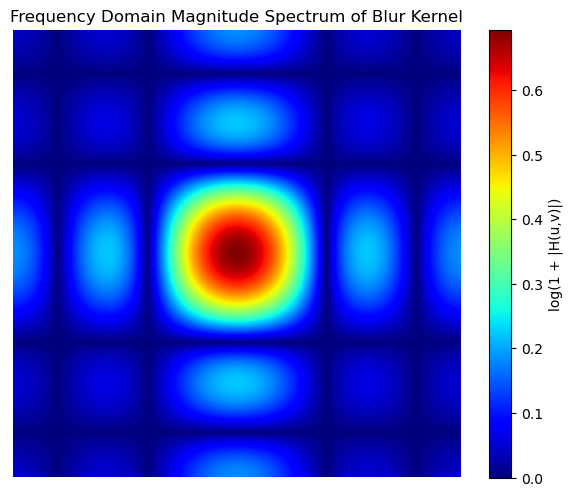

In [16]:
# Plot the frequency spectrum
plt.figure(figsize=(6, 5))
plt.imshow(H_magnitude_log, cmap='jet')
plt.title('Frequency Domain Magnitude Spectrum of Blur Kernel')
plt.axis('off')
plt.colorbar(label='log(1 + |H(u,v)|)')
plt.tight_layout()
plt.show()

In [19]:
def inverse_filter(degraded_img, H, epsilon):
    """Apply inverse filter in frequency domain with small epsilon to avoid division by zero"""
    G = fft2(degraded_img)
    H_safe = H.copy()
    H_safe[np.abs(H) < epsilon] = epsilon  # Avoid division by zero
    F_hat = G / H_safe
    f_restored = np.abs(ifft2(F_hat))
    return f_restored

# Load original image (grayscale)
image = cv2.imread('/mnt/e/Term 4/HW/DIP-HW4/data/images/q3/1.png', cv2.IMREAD_GRAYSCALE).astype(np.float32)

# Create blur kernel
kernel = np.ones((5, 5), dtype=np.float32) / 25

# Create degradation function in frequency domain
H = make_degradation_function(image.shape, kernel)

# Apply inverse filtering
restored = inverse_filter(image, H, 0)

/tmp/ipykernel_1504/2781378394.py:6: RuntimeWarning: divide by zero encountered in divide
  F_hat = G / H_safe


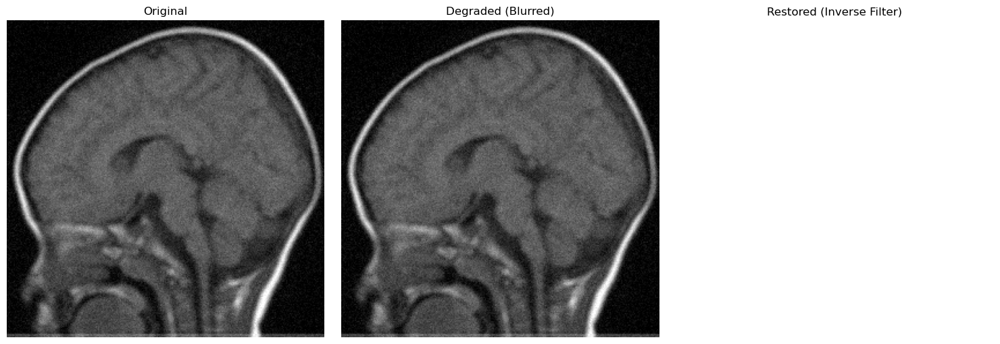

In [20]:
# Show results
plt.figure(figsize=(15, 5))
plt.subplot(1, 3, 1); plt.imshow(image, cmap='gray'); plt.title('Original'); plt.axis('off')
plt.subplot(1, 3, 2); plt.imshow(degraded1, cmap='gray'); plt.title('Degraded (Blurred)'); plt.axis('off')
plt.subplot(1, 3, 3); plt.imshow(restored, cmap='gray'); plt.title('Restored (Inverse Filter)'); plt.axis('off')
plt.tight_layout()
plt.show()

In [21]:
def wiener_filter(degraded_img, H, K):
    """ 
    Apply Wiener filter in the frequency domain
    """
    G = fft2(degraded_img)
    H_conj = np.conj(H)
    H_abs2 = np.abs(H) ** 2
    F_hat = (H_conj / (H_abs2 + K)) * G
    f_restored = np.abs(ifft2(F_hat))
    return f_restored

kernel = np.ones((5, 5), dtype=np.float32) / 25
noise_var = 1000
signal_var = np.var(ideal1)
K = noise_var / signal_var
H = make_degradation_function(degraded1.shape, kernel)
restored = wiener_filter(degraded1, H, K)

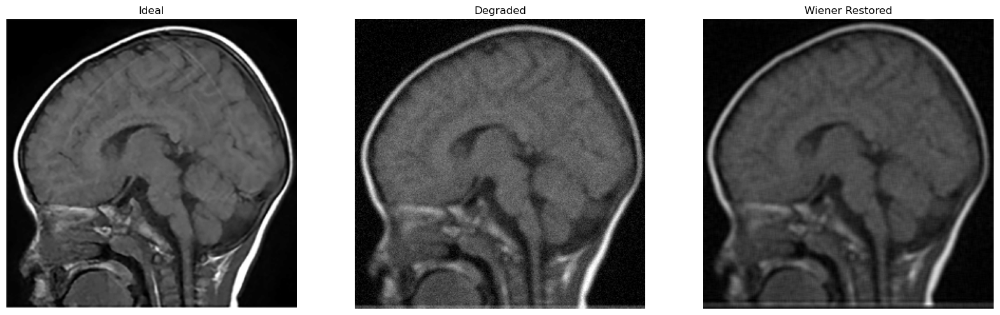

In [22]:
plt.figure(figsize=(20, 8))
plt.subplot(1,3,1); plt.imshow(ideal1, cmap='gray'); plt.title('Ideal'); plt.axis('off')
plt.subplot(1,3,2); plt.imshow(degraded1, cmap='gray'); plt.title('Degraded'); plt.axis('off')
plt.subplot(1,3,3); plt.imshow(restored, cmap='gray'); plt.title('Wiener Restored'); plt.axis('off')
plt.show()

In [26]:
def compute_mse(img1, img2):
    """
    Compute Mean Squared Error between two images
    """
    return np.mean((img1 - img2) ** 2)

# Define kernel and degradation function
kernel = np.ones((5, 5), dtype=np.float32) / 25
H = make_degradation_function(degraded1.shape, kernel)

# Define range of K values
K_values = np.logspace(-2, 0, num=50)  # Zoomed-in range: 0.01 to 1
mse_values = []

# Compute MSE for each K
for K in K_values:
    restored_img1 = wiener_filter(degraded1, H, K)
    mse = compute_mse(ideal1, restored_img1)
    mse_values.append(mse)

# Find optimal K (min MSE)
min_mse = min(mse_values)
optimal_index = mse_values.index(min_mse)
optimal_K = K_values[optimal_index]

print(f"Optimal K = {optimal_K:.6f} with minimum MSE = {min_mse:.2f}")

Optimal K = 0.167683 with minimum MSE = 1349.03


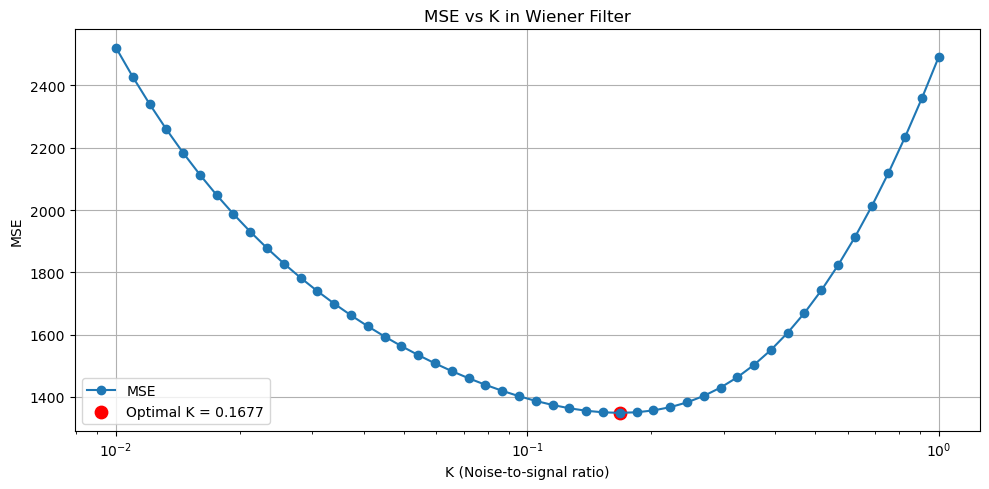

In [27]:
# Plot
plt.figure(figsize=(10, 5))
plt.plot(K_values, mse_values, marker='o', label='MSE')
plt.xscale('log')
plt.xlabel('K (Noise-to-signal ratio)')
plt.ylabel('MSE')
plt.title('MSE vs K in Wiener Filter')
plt.grid(True)

# Highlight optimal K
plt.scatter(optimal_K, min_mse, color='red', s=80, label=f'Optimal K = {optimal_K:.4f}')
plt.legend()
plt.tight_layout()
plt.show()


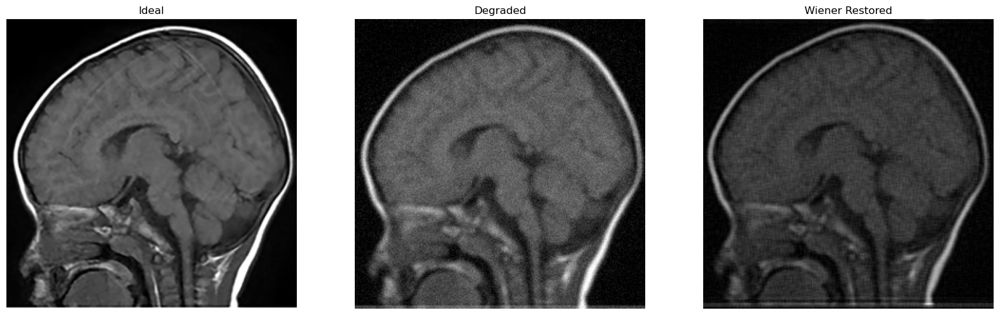

In [28]:
K = 0.1048
H = make_degradation_function(degraded1.shape, kernel)
restored1 = wiener_filter(degraded1, H, K)

plt.figure(figsize=(20, 8))
plt.subplot(1,3,1); plt.imshow(ideal1, cmap='gray'); plt.title('Ideal'); plt.axis('off')
plt.subplot(1,3,2); plt.imshow(degraded1, cmap='gray'); plt.title('Degraded'); plt.axis('off')
plt.subplot(1,3,3); plt.imshow(restored1, cmap='gray'); plt.title('Wiener Restored'); plt.axis('off')
plt.show()

In [29]:
compute_mse(ideal1, restored1)

1387.3577849033152

Optimal K = 0.167683 with minimum MSE = 1265.27


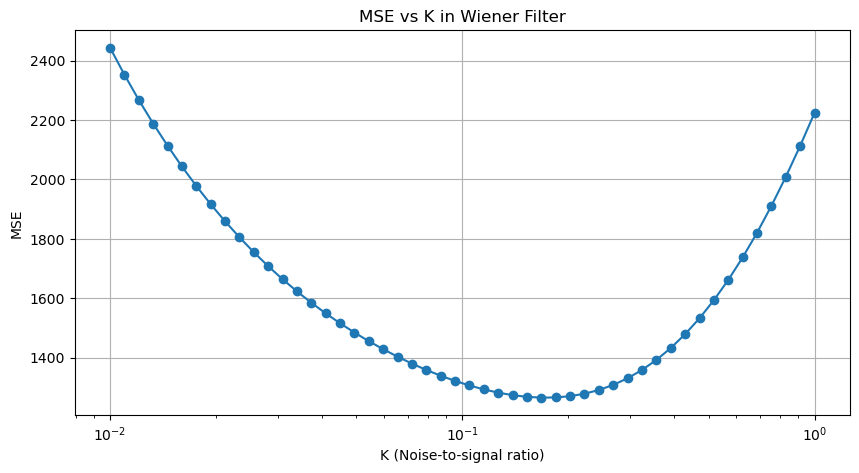

In [33]:
# Define kernel and degradation function
kernel = np.ones((5, 5), dtype=np.float32) / 25
H = make_degradation_function(degraded2.shape, kernel)

# Define range of K values
K_values = np.logspace(-2, 0, num=50)  # Zoomed-in range: 0.01 to 1
mse_values = []

# Compute MSE for each K
for K in K_values:
    restored_img2 = wiener_filter(degraded2, H, K)
    mse = compute_mse(ideal2, restored_img2)
    mse_values.append(mse)

# Find optimal K (min MSE)
min_mse = min(mse_values)
optimal_index = mse_values.index(min_mse)
optimal_K = K_values[optimal_index]

print(f"Optimal K = {optimal_K:.6f} with minimum MSE = {min_mse:.2f}")

# Plot
plt.figure(figsize=(10, 5))
plt.plot(K_values, mse_values, marker='o', label='MSE')
plt.xscale('log')
plt.xlabel('K (Noise-to-signal ratio)')
plt.ylabel('MSE')
plt.title('MSE vs K in Wiener Filter')
plt.grid(True)

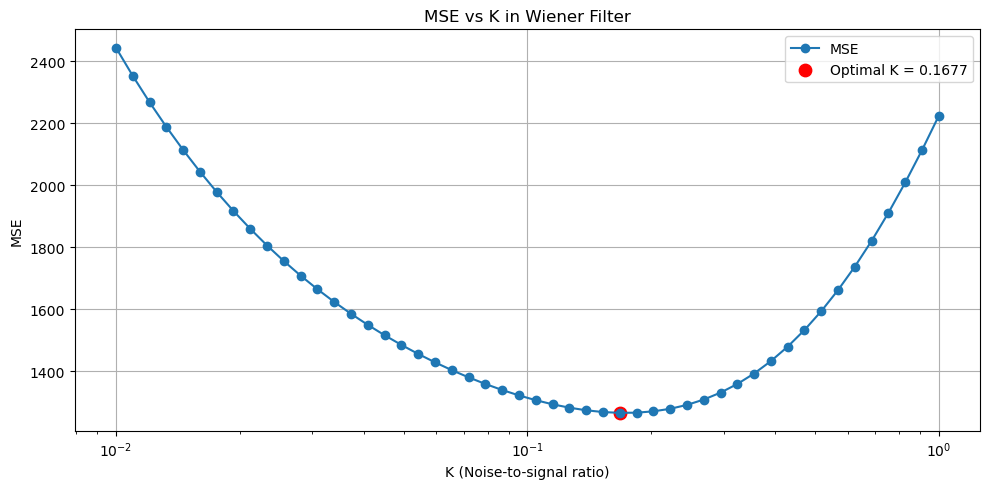

In [34]:
# Plot
plt.figure(figsize=(10, 5))
plt.plot(K_values, mse_values, marker='o', label='MSE')
plt.xscale('log')
plt.xlabel('K (Noise-to-signal ratio)')
plt.ylabel('MSE')
plt.title('MSE vs K in Wiener Filter')
plt.grid(True)

# Highlight optimal K
plt.scatter(optimal_K, min_mse, color='red', s=80, label=f'Optimal K = {optimal_K:.4f}')
plt.legend()
plt.tight_layout()
plt.show()

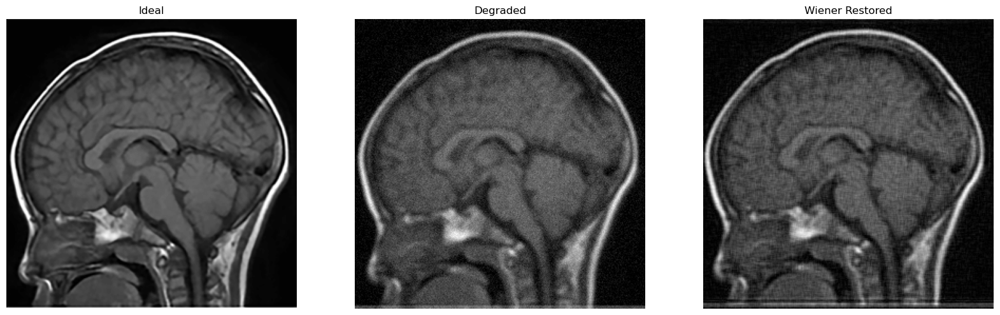

In [35]:
K = 0.1048
H = make_degradation_function(degraded2.shape, kernel)
restored2 = wiener_filter(degraded2, H, K)

plt.figure(figsize=(20, 8))
plt.subplot(1,3,1); plt.imshow(ideal2, cmap='gray'); plt.title('Ideal'); plt.axis('off')
plt.subplot(1,3,2); plt.imshow(degraded2, cmap='gray'); plt.title('Degraded'); plt.axis('off')
plt.subplot(1,3,3); plt.imshow(restored2, cmap='gray'); plt.title('Wiener Restored'); plt.axis('off')
plt.show()

In [36]:
compute_mse(ideal2, restored2)

1306.1622455013344

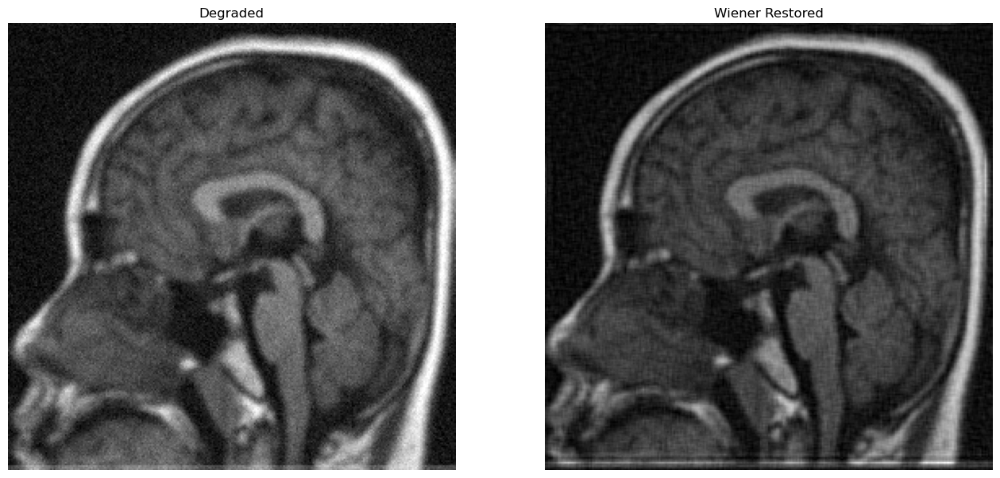

In [37]:
# Load original image (grayscale)
image3 = cv2.imread('/mnt/e/Term 4/HW/DIP-HW4/data/images/q3/3.png', cv2.IMREAD_GRAYSCALE).astype(np.float32)

K = 0.1048
H = make_degradation_function(image3.shape, kernel)
restored3 = wiener_filter(image3, H, K)

plt.figure(figsize=(16, 8))
plt.subplot(1,2,1); plt.imshow(image3, cmap='gray'); plt.title('Degraded'); plt.axis('off')
plt.subplot(1,2,2); plt.imshow(restored3, cmap='gray'); plt.title('Wiener Restored'); plt.axis('off')
plt.show()

___